In [1]:
# Imports for EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')

# Explanatory Data Analysis

In [2]:
# Read a CSV file into a DataFrame
df = pd.read_csv('churn_data.csv')
df.head()

,CustomerID,Geography,Gender,Age_Band,TenureYears,EstimatedIncome,BalanceEuros,NoProducts,CreditCardholder,CustomerWithLoan,Digital_TRX_ratio,Inactive
0,5188208,Rest_GR,Male,18-25,0,40683.96,50086.2120,1,0,0,0.38,0
1,8683784,Thessaloniki,Female,65+,4,2429.51,0.0000,1,1,0,0.33,1
2,3512360,Athens,Male,45-55,4,41694.49,26852.7072,1,1,1,0.72,0
3,7104818,Rest_GR,Male,25-35,5,74523.33,90325.6200,1,0,0,0.08,0
4,6712745,Rest_GR,Female,25-35,9,111050.49,100537.0608,2,0,0,1.38,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         10000 non-null  int64  
 1   Geography          10000 non-null  object 
 2   Gender             10000 non-null  object 
 3   Age_Band           10000 non-null  object 
 4   TenureYears        10000 non-null  int64  
 5   EstimatedIncome    10000 non-null  float64
 6   BalanceEuros       10000 non-null  float64
 7   NoProducts         10000 non-null  int64  
 8   CreditCardholder   10000 non-null  int64  
 9   CustomerWithLoan   10000 non-null  int64  
 10  Digital_TRX_ratio  10000 non-null  float64
 11  Inactive           10000 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 937.6+ KB


In [4]:
df.describe()

,CustomerID,TenureYears,EstimatedIncome,BalanceEuros,NoProducts,CreditCardholder,CustomerWithLoan,Digital_TRX_ratio,Inactive
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5.056704e+06,5.012800,88078.508767,50480.686930,1.530200,0.70550,0.515100,0.696598,0.204200
std,2.868552e+06,2.892174,50034.128696,41182.287434,0.581654,0.45584,0.499797,0.199715,0.403136
min,5.080000e+02,0.000000,1010.070000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000
25%,2.596564e+06,3.000000,45371.835000,0.000000,1.000000,0.00000,0.000000,0.560000,0.000000
50%,5.040021e+06,5.000000,88168.705000,64151.036400,1.000000,1.00000,1.000000,0.700000,0.000000
75%,7.521026e+06,7.000000,130967.772500,84245.198400,2.000000,1.00000,1.000000,0.830000,0.000000
max,9.999654e+06,10.000000,174993.460000,165592.739400,4.000000,1.00000,1.000000,1.420000,1.000000


### Per column EDA

Helper functions for EDA

In [132]:
## General function for simple EDA
def eda_column(dataframe,col,to_plot,to_boxplot,figsize=(10,5),bins=20):
    # check for duplicates
    print('# Duplicates: ', dataframe['TenureYears'].duplicated().sum())
    # Missing values
    print('# Missing values: ', dataframe['TenureYears'].isnull().sum())
    print(dataframe[col].describe())
    if to_plot:
        # Histogram
        dataframe[col].hist(figsize=figsize, bins=bins)
        if to_boxplot:
            # Boxplot
            plt.figure(figsize=figsize)
            sns.boxplot(dataframe[col])

def eda_col_2(dataframe, col):
    # Reorganize dataframe for plotting count
    grouped = dataframe.groupby(col)['Inactive'].agg(Count='value_counts')
    dfgeoc = grouped
    dfgeoc = dfgeoc.pivot_table(values='Count', index=col, columns=['Inactive'])
    # Calculate percentage within each class
    dfgp = grouped.groupby(level=[0]).apply(lambda g: round(g * 100 / g.sum(), 2))
    dfgp.rename(columns={'Count': 'Percentage'}, inplace=True)
    dfgp = dfgp.pivot_table(values='Percentage', index=col, columns=['Inactive'])
    display(dfgp)
    dfgp.plot(kind='bar',
            color=['g', 'r'],
            rot=0)
    ax1.legend(labels)
    ax1.set_title(f'Churn Risk per {col} (Count)', fontsize=14, pad=10)
    ax1.set_ylabel('Count',size=12)
    ax1.set_xlabel(col, size=12)

CustomerID

In [6]:
# CunstomerID
print(df['CustomerID'].nunique() == df.shape[0])
# check for duplicates
print('# Duplicates: ', df['CustomerID'].duplicated().sum())
# Missing values
print('# Missing values: ', df['CustomerID'].isnull().sum())


True
# Duplicates:  0
# Missing values:  0


TenureYears

In [7]:
df['TenureYears'].unique()

array([ 0,  4,  5,  9,  1,  8,  6, 10,  2,  3,  7], dtype=int64)

# Duplicates:  9989
# Missing values:  0
count    10000.000000
mean         5.012800
std          2.892174
min          0.000000
25%          3.000000
50%          5.000000
75%          7.000000
max         10.000000
Name: TenureYears, dtype: float64


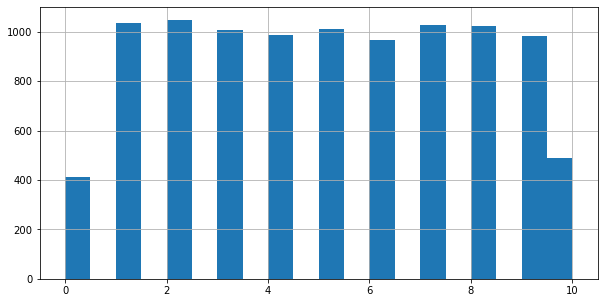

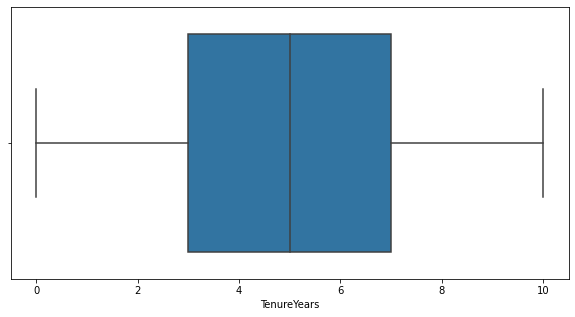

In [8]:
# TenureYears
eda_column(df,'TenureYears',True,True,(10,5),20)

Except 10 and 0 years, all other years have about the same number of instances.

Geography

# Duplicates:  9989
# Missing values:  0
count      10000
unique         3
top       Athens
freq        5014
Name: Geography, dtype: object


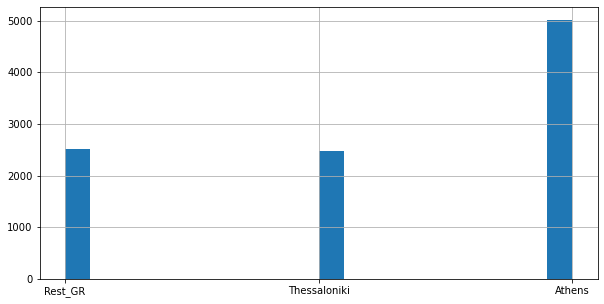

In [9]:
eda_column(df,'Geography',True,False,(10,5),20)

Inactive,0,1
Geography,,
Athens,83.79,16.21
Rest_GR,67.52,32.48
Thessaloniki,83.29,16.71


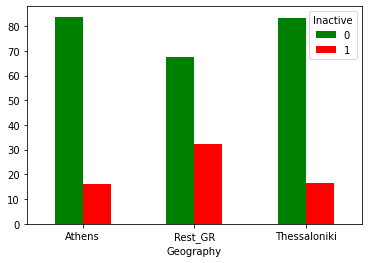

In [133]:
eda_col_2(df,'Geography')

Half of the customers' registration region (5000 out of 10000) come from Athens

Gender

In [10]:
df['Gender'].unique()

array(['Male', 'Female'], dtype=object)

# Duplicates:  9989
# Missing values:  0
count     10000
unique        2
top        Male
freq       5457
Name: Gender, dtype: object


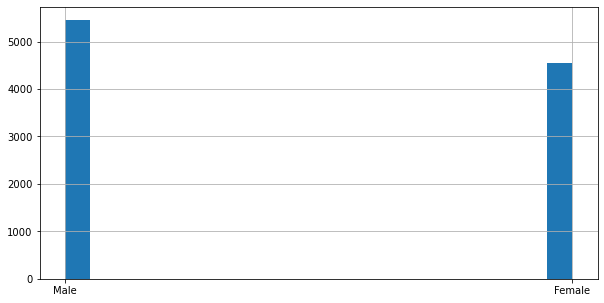

In [11]:
eda_column(df, 'Gender', True, False, (10,5), 20)

Most of the customers are males (but the ratio is close to 50% for both genders)

Age_Band

In [12]:
df['Age_Band'].unique()

array(['18-25', '65+', '45-55', '25-35', '55-65', '35-45'], dtype=object)

# Duplicates:  9989
# Missing values:  0
count     10000
unique        6
top       35-45
freq       3736
Name: Age_Band, dtype: object


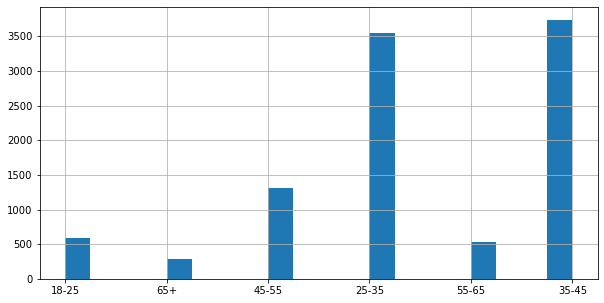

In [13]:
eda_column(df, 'Age_Band', True, False, (10,5), 20)

Most of the customers are young ranging from 25 to 45. After 45 years old, the number of customers is low compared to the first two categories

Percentage
Gender Inactive            
Female 0              74.82
       1              25.18
Male   0              83.54
       1              16.46

KeyError: 'Geography'

EstimatedIncome

# Duplicates:  9989
# Missing values:  0
count     10000.000000
mean      88078.508767
std       50034.128696
min        1010.070000
25%       45371.835000
50%       88168.705000
75%      130967.772500
max      174993.460000
Name: EstimatedIncome, dtype: float64


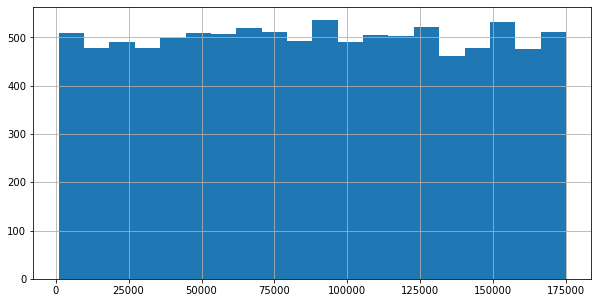

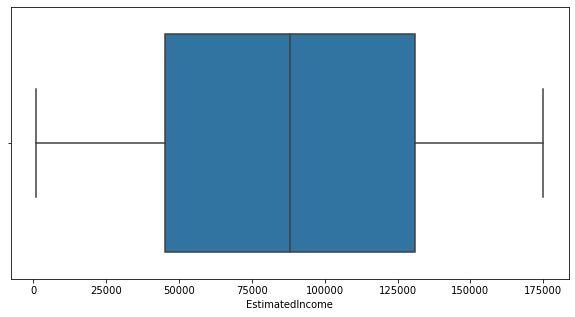

In [14]:
eda_column(df, 'EstimatedIncome', True, True, (10,5), 20)

In [15]:
df['EstimatedIncome'].groupby(pd.cut(df['EstimatedIncome'], np.arange(0, 200000, 10000))).count()

EstimatedIncome
(0, 10000]          527
(10000, 20000]      545
(20000, 30000]      562
(30000, 40000]      554
(40000, 50000]      588
(50000, 60000]      592
(60000, 70000]      572
(70000, 80000]      589
(80000, 90000]      590
(90000, 100000]     582
(100000, 110000]    579
(110000, 120000]    581
(120000, 130000]    590
(130000, 140000]    541
(140000, 150000]    561
(150000, 160000]    597
(160000, 170000]    553
(170000, 180000]    297
(180000, 190000]      0
Name: EstimatedIncome, dtype: int64

The yearly income of the customers is give or take uniformly distributed. 500-600 customers per 10.000 euros

BalanceEuros

# Duplicates:  9989
# Missing values:  0
count     10000.000000
mean      50480.686930
std       41182.287434
min           0.000000
25%           0.000000
50%       64151.036400
75%       84245.198400
max      165592.739400
Name: BalanceEuros, dtype: float64


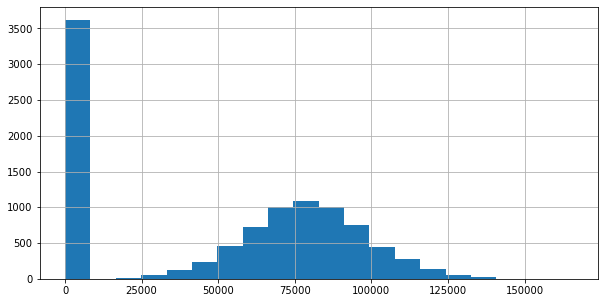

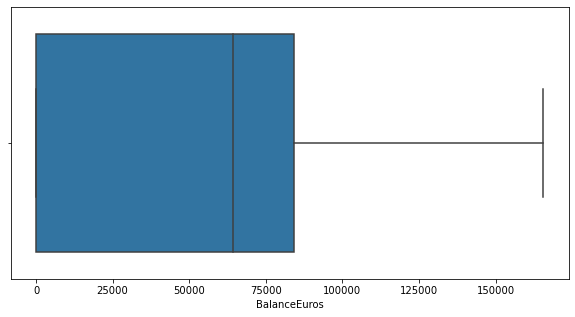

In [16]:
eda_column(df, 'BalanceEuros', True, True, (10,5), 20)

In [17]:
# percentage of customers with zero balance
print('Percentage of customers with zero balance: ', df[df['BalanceEuros'] == 0].shape[0]/df.shape[0]*100)
# percentage of customers with non zero balance
print('Percentage of customers with non zero balance: ', df[df['BalanceEuros'] != 0].shape[0]/df.shape[0]*100)

Percentage of customers with zero balance:  36.17
Percentage of customers with non zero balance:  63.83


36% of customers have zero balance in euros !!!
64% of customers have non zero balance 

# Duplicates:  6372
# Missing values:  0
count      6383.000000
mean      79086.145903
std       19862.737265
min        2487.335400
25%       66120.103500
50%       79094.195400
75%       92078.111400
max      165592.739400
Name: BalanceEuros, dtype: float64


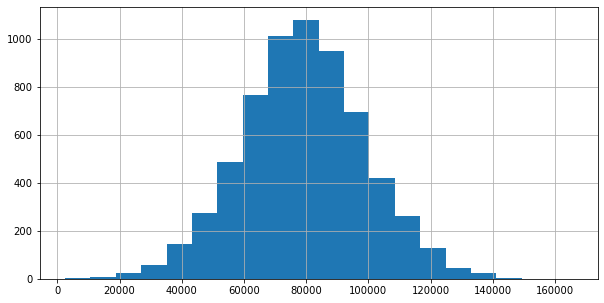

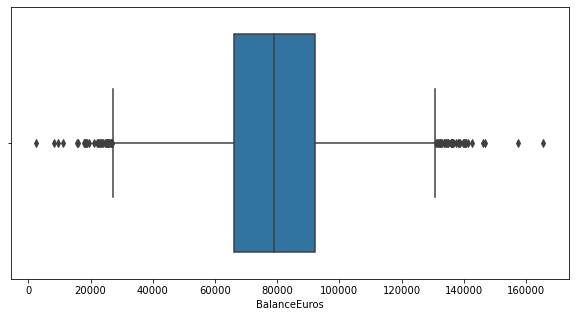

In [18]:
# Distribution of non zero balance customers
eda_column(df[df['BalanceEuros'] != 0], 'BalanceEuros', True, True, (10,5), 20)

In [19]:
# # number of customers in the vicinity of mean balance
# print('Percentage of customers in the vicinity of mean balance: ', df[df['BalanceEuros'].between(75000, 85000)].shape[0]*100/df[df['BalanceEuros'] != 0].shape[0] )

NoProducts

In [20]:
df['NoProducts'].unique()

array([1, 2, 4, 3], dtype=int64)

# Duplicates:  9989
# Missing values:  0
count    10000.000000
mean         1.530200
std          0.581654
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max          4.000000
Name: NoProducts, dtype: float64


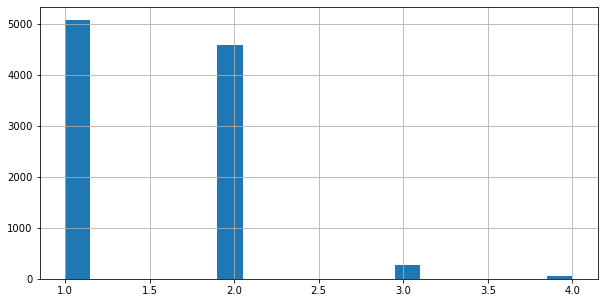

In [21]:
eda_column(df, 'NoProducts', True, False, (10,5), 20)

Most of the customers hold up to 2 products

CreditCardholder

In [22]:
df['CreditCardholder'].unique()

array([0, 1], dtype=int64)

# Duplicates:  9989
# Missing values:  0
count    10000.00000
mean         0.70550
std          0.45584
min          0.00000
25%          0.00000
50%          1.00000
75%          1.00000
max          1.00000
Name: CreditCardholder, dtype: float64


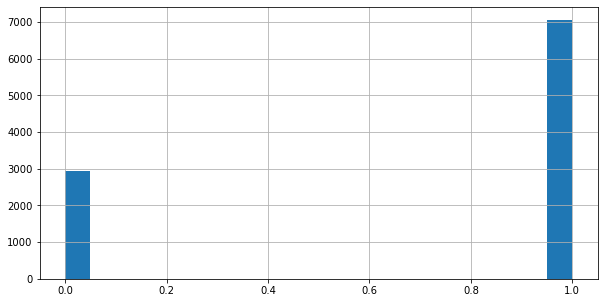

In [23]:
eda_column(df, 'CreditCardholder', True, False, (10,5), 20)

70% of the customers hold credit card. 30% of the customers do not hold a credit card !!!

CustomerWithLoan

In [24]:
df['CustomerWithLoan'].unique()

array([0, 1], dtype=int64)

# Duplicates:  9989
# Missing values:  0
count    10000.000000
mean         0.515100
std          0.499797
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: CustomerWithLoan, dtype: float64


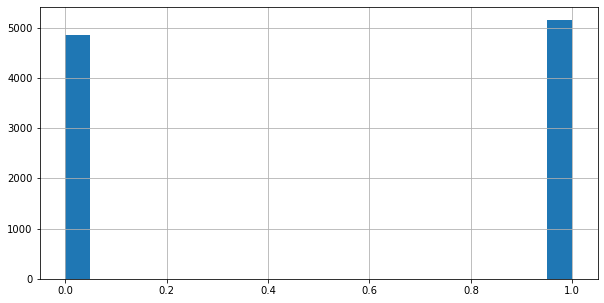

In [25]:
eda_column(df, 'CustomerWithLoan', True, False, (10,5), 20)

In [93]:
df['CustomerWithLoan'].value_counts()*100 / df.shape[0]

1    51.51
0    48.49
Name: CustomerWithLoan, dtype: float64

50-50 % the customers have/have not taken a loan

Digital_TRX_ratio

In [26]:
df['Digital_TRX_ratio'].unique()

array([0.38, 0.33, 0.72, 0.08, 1.38, 0.67, 0.51, 0.81, 0.76, 0.54, 0.8 ,
       0.89, 0.71, 0.82, 0.69, 0.83, 0.58, 1.05, 0.84, 0.86, 0.77, 0.52,
       0.7 , 0.31, 0.66, 0.39, 0.75, 0.48, 1.01, 0.68, 0.93, 1.04, 0.57,
       1.07, 0.53, 0.62, 0.91, 1.16, 1.06, 0.88, 0.3 , 0.34, 0.64, 0.98,
       0.74, 0.99, 1.34, 0.47, 0.46, 0.56, 0.15, 0.92, 0.63, 0.5 , 0.61,
       0.79, 1.11, 0.37, 1.03, 0.85, 0.49, 0.73, 0.45, 0.9 , 0.6 , 0.96,
       1.  , 0.42, 0.4 , 0.78, 0.43, 0.97, 0.35, 0.36, 0.59, 0.65, 0.06,
       0.41, 1.12, 0.94, 0.55, 0.32, 0.44, 0.87, 0.27, 0.12, 1.25, 0.95,
       0.29, 0.24, 1.21, 0.26, 1.02, 0.23, 1.37, 1.15, 0.2 , 0.22, 1.14,
       1.1 , 1.08, 1.09, 1.24, 0.17, 1.13, 0.21, 0.13, 1.18, 0.28, 0.01,
       0.19, 1.3 , 1.23, 1.33, 1.27, 1.17, 0.04, 1.22, 0.18, 0.11, 0.  ,
       1.28, 1.2 , 0.07, 1.19, 0.03, 0.25, 0.14, 0.02, 0.1 , 1.29, 1.42,
       1.36, 1.31, 0.16, 1.26, 1.32])

# Duplicates:  9989
# Missing values:  0
count    10000.000000
mean         0.696598
std          0.199715
min          0.000000
25%          0.560000
50%          0.700000
75%          0.830000
max          1.420000
Name: Digital_TRX_ratio, dtype: float64


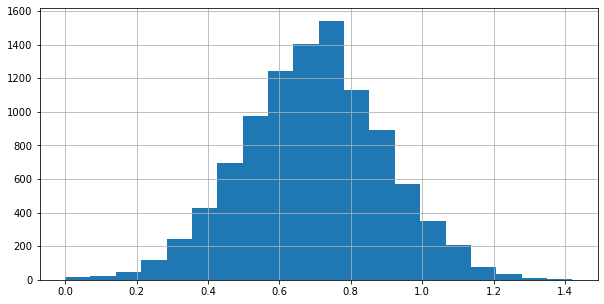

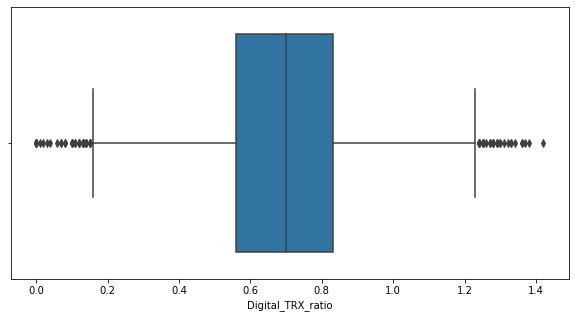

In [27]:
eda_column(df, 'Digital_TRX_ratio', True, True, (10,5), 20)

In [95]:
# quantity of customers with less than 1 ratio
print('Percentage of customers with more physical trans: ', df[df['Digital_TRX_ratio'] < 1].shape[0]*100/df.shape[0] )
print('Percentage of customers with more digital trans: ', df[df['Digital_TRX_ratio'] > 1].shape[0]*100/df.shape[0] )
print('Percentage of customers equal digital/phys trans: ', df[df['Digital_TRX_ratio'] == 1].shape[0]*100/df.shape[0] )

Percentage of customers with more physical trans:  93.16
Percentage of customers with more digital trans:  6.14
Percentage of customers equal digital/phys trans:  0.7


93% of the customers make more physical transactions over digital. 7% of the customers make more digital transactions. Most of the customers have a ratio around 70% 

Inactive

In [29]:
df['Inactive'].unique()

array([0, 1], dtype=int64)

# Duplicates:  9989
# Missing values:  0
count    10000.000000
mean         0.204200
std          0.403136
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: Inactive, dtype: float64


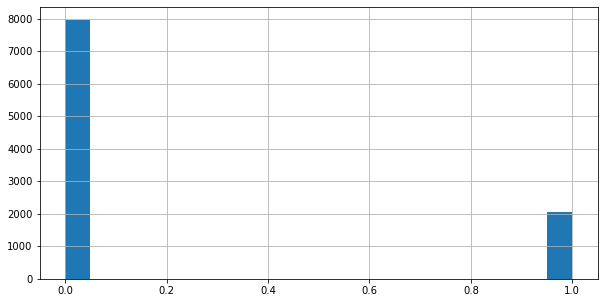

In [30]:
eda_column(df, 'Inactive', True, False, (10,5), 20)

80% of the customers are active and 20% are inactive. Highly imbalance dataset

## Multivariate Analysis

All following analysis will include the relation with inactivity

In [31]:
# dupplicated rows
print('# Duplicates: ', df.duplicated().sum())
# missing values
print('# Missing values: ', df.isnull().sum().sum())

# Duplicates:  0
# Missing values:  0


In [32]:
df.columns

Index(['CustomerID', 'Geography', 'Gender', 'Age_Band', 'TenureYears',
       'EstimatedIncome', 'BalanceEuros', 'NoProducts', 'CreditCardholder',
       'CustomerWithLoan', 'Digital_TRX_ratio', 'Inactive'],
      dtype='object')

In [134]:
# Calculate correlations between numeric features
correlations = df.corr()

# sort features in order of their correlation with "Exited"
sort_corr_cols = correlations.Inactive.sort_values(ascending=False).keys()
sort_corr = correlations.loc[sort_corr_cols,sort_corr_cols]
sort_corr

,Inactive,BalanceEuros,EstimatedIncome,Digital_TRX_ratio,CreditCardholder,TenureYears,NoProducts,CustomerWithLoan
Inactive,1.000000,0.118480,0.012243,-0.001147,-0.007418,-0.013736,-0.048054,-0.156272
BalanceEuros,0.118480,1.000000,0.012797,-0.003285,-0.014858,-0.012254,-0.304180,-0.010084
EstimatedIncome,0.012243,0.012797,1.000000,0.012033,-0.009933,0.007784,0.014204,-0.011421
Digital_TRX_ratio,-0.001147,-0.003285,0.012033,1.000000,-0.025727,-0.010381,0.010940,-0.001239
CreditCardholder,-0.007418,-0.014858,-0.009933,-0.025727,1.000000,0.022583,0.003183,-0.011866
TenureYears,-0.013736,-0.012254,0.007784,-0.010381,0.022583,1.000000,0.013444,-0.028362
NoProducts,-0.048054,-0.304180,0.014204,0.010940,0.003183,0.013444,1.000000,0.009612
CustomerWithLoan,-0.156272,-0.010084,-0.011421,-0.001239,-0.011866,-0.028362,0.009612,1.000000


No significant linear correlations among numeric features

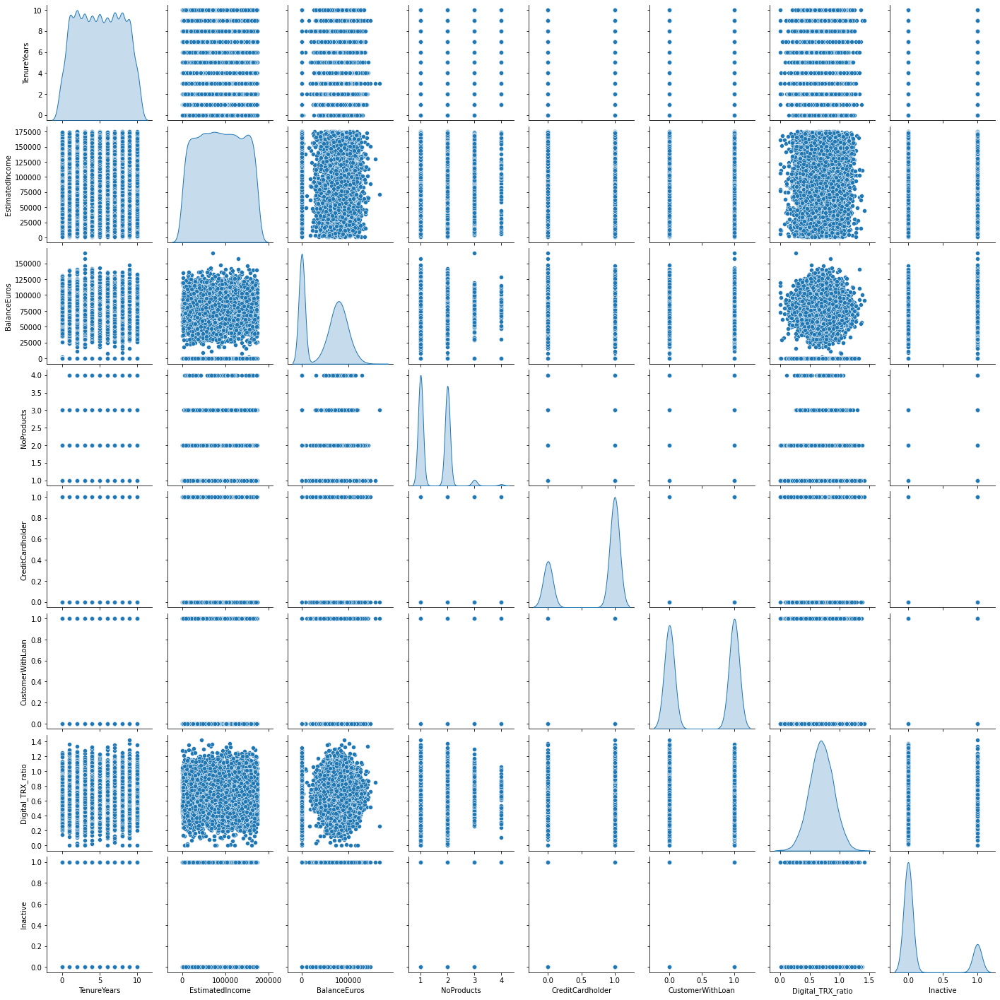

In [33]:
sns.pairplot(df.iloc[:,1:], diag_kind='kde')

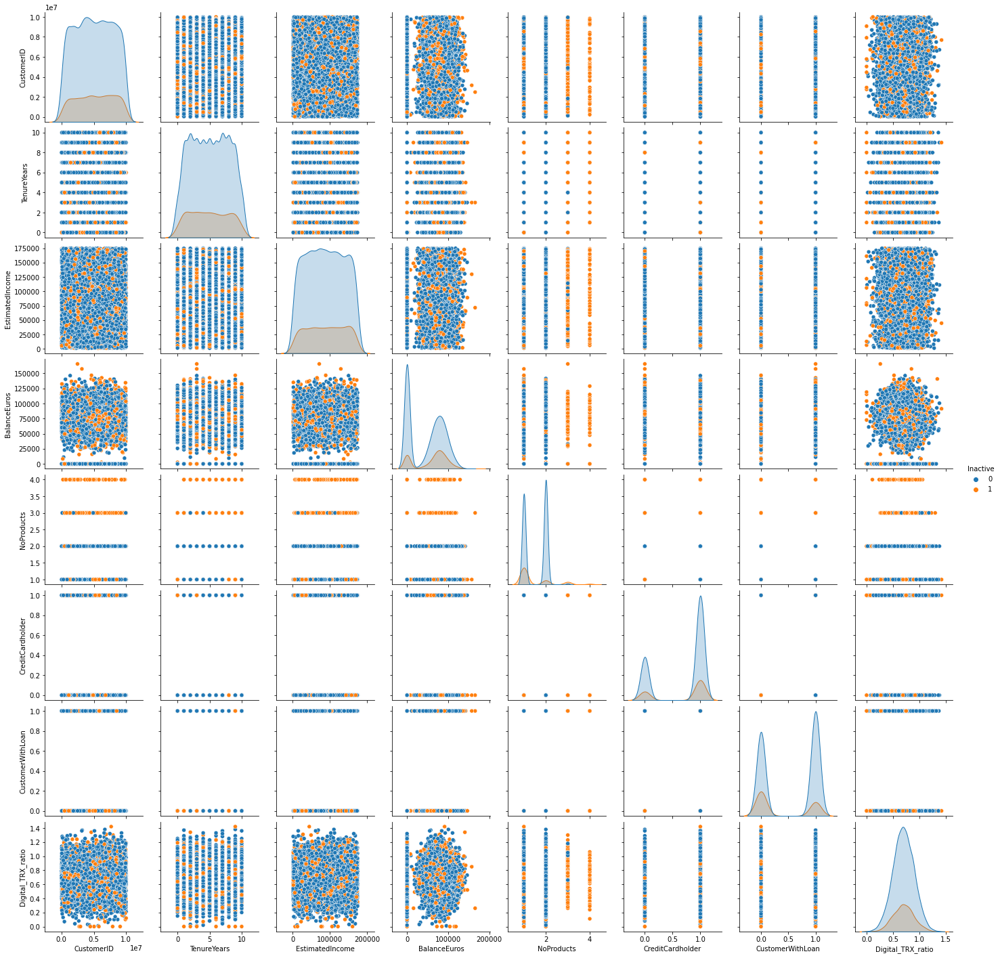

In [34]:
sns.pairplot(data=df, hue='Inactive')

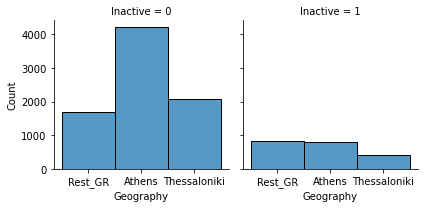

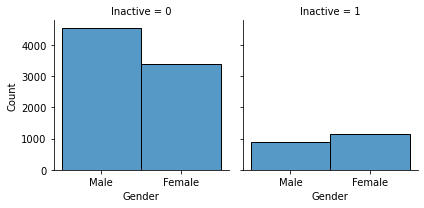

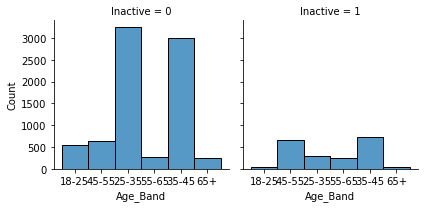

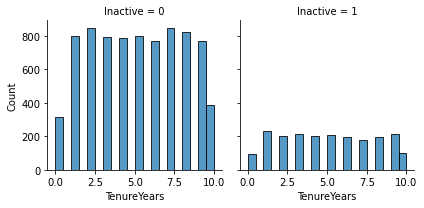

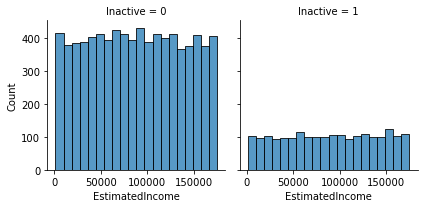

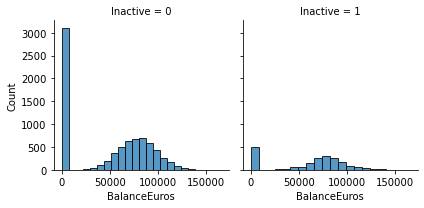

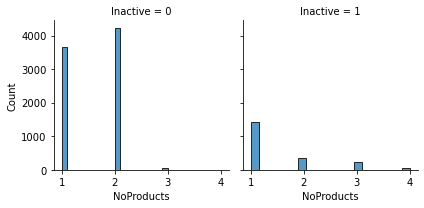

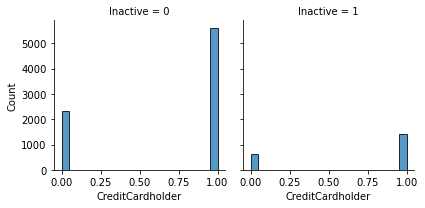

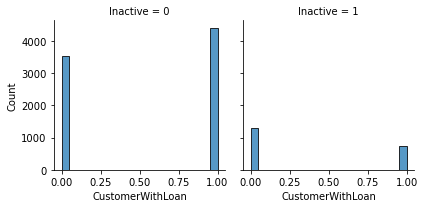

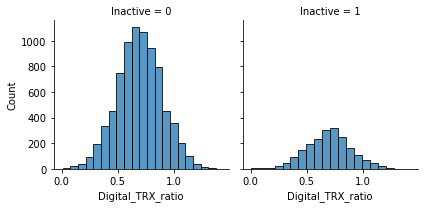

In [35]:
# scatter plot
features = df.columns[1:-1]
for feat in features:
    g = sns.FacetGrid(df, col="Inactive")
    g.map(sns.histplot, feat, bins=20)

- Women are more inactive (and probably churn) than men. Men are more active!
- 45-55 years old is the only category with equal active and inactive. Also 25-45. is the only two categories with the most instances. These categories are the most active.
- Estimated income, Tenure years are not directly related to inactivity.
- 1/3 of the customers have zero balance in euros. The rest 2/3 have non zero. The difference in inactive customers is not that big.
- Among inactive customers most customers have 1 product, but among active and inactive customers, customers with 3 and 4 products are more inactive. (That is not reasonable - counterintuitive)
- Customers with loan are more active. Among inactive users, customers without loan are more in number.


In [36]:
# Percentage difference of customers with and without loan and inactive/active
print('Percentage of customers with/without loan and inactive: ', (df[(df['CustomerWithLoan'] == 1) & (df['Inactive'] == 1)].shape[0] - df[(df['CustomerWithLoan'] == 0) & (df['Inactive'] == 1)].shape[0])*100 / df[df['Inactive'] == 1].shape[0] )
print('Percentage of customers with/without loan and active: ', (df[(df['CustomerWithLoan'] == 1) & (df['Inactive'] == 0)].shape[0] - df[(df['CustomerWithLoan'] == 0) & (df['Inactive'] == 0)].shape[0])*100 / df[df['Inactive'] == 0].shape[0])


Percentage of customers with/without loan and inactive:  -27.81586679725759
Percentage of customers with/without loan and active:  10.932395074139231


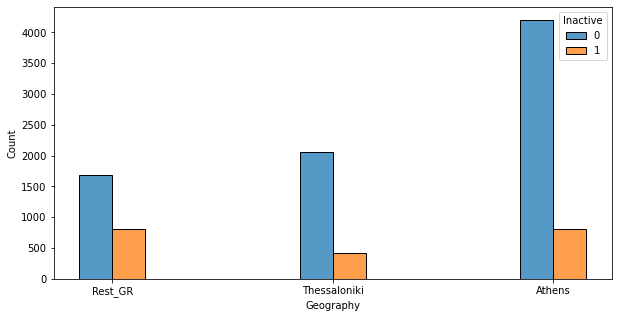

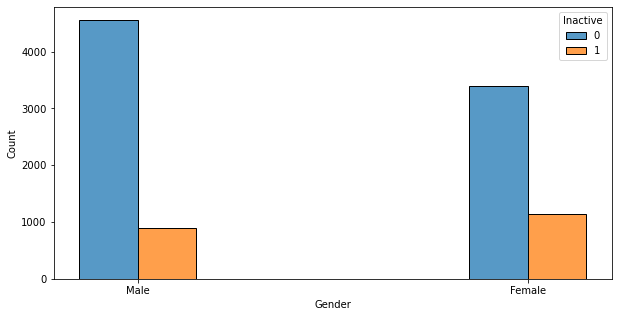

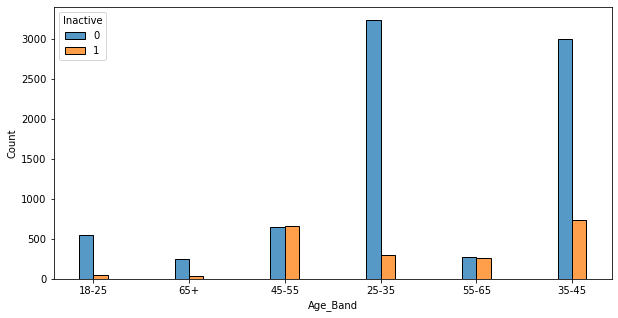

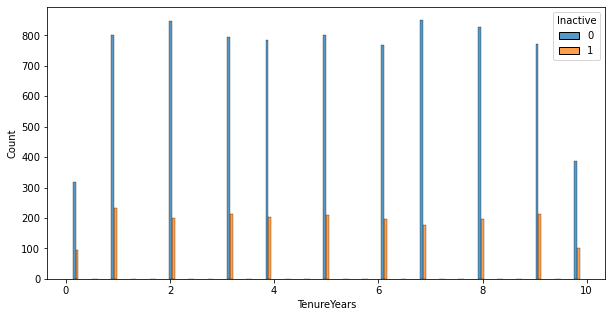

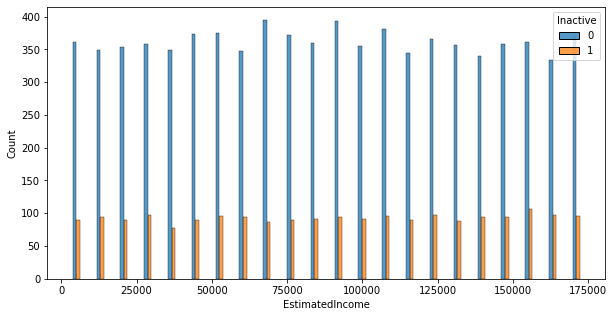

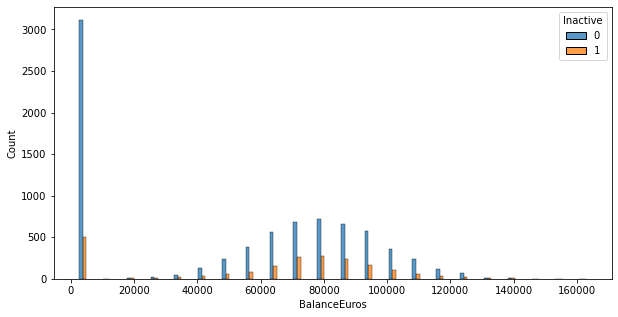

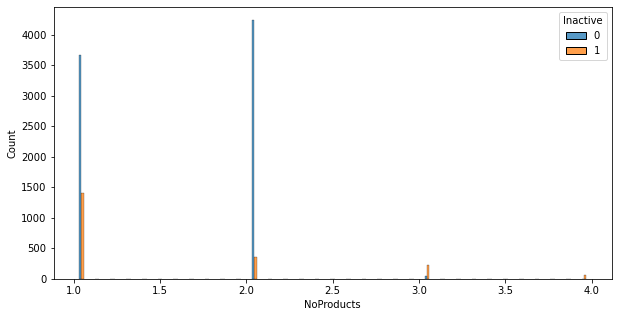

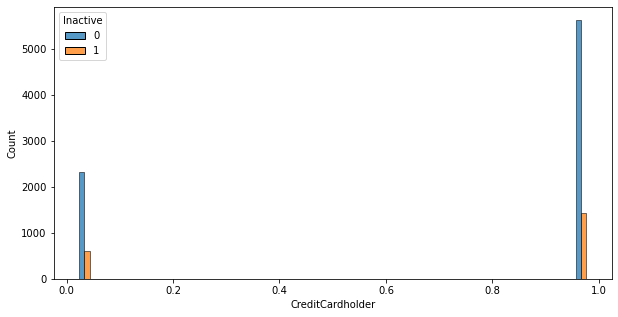

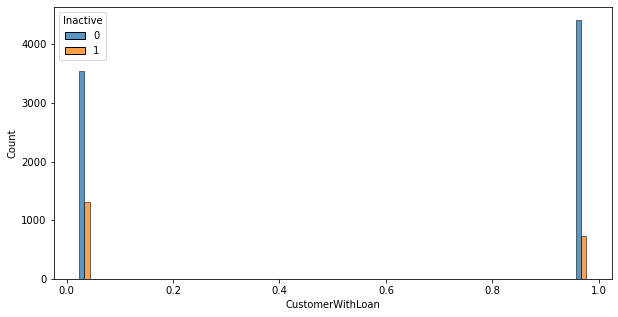

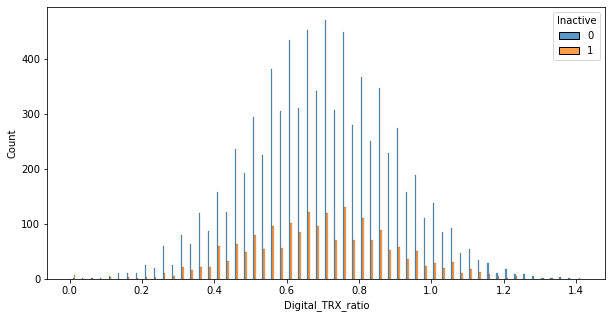

In [37]:
for feat in features:
    plt.figure(figsize=(10,5))
    sns.histplot(data=df, x=feat, hue="Inactive", multiple="dodge", shrink=.3)

In [38]:
# drop CustomerID because it is unique for each customer
df.drop('CustomerID', axis=1, inplace=True)
df.head()

,Geography,Gender,Age_Band,TenureYears,EstimatedIncome,BalanceEuros,NoProducts,CreditCardholder,CustomerWithLoan,Digital_TRX_ratio,Inactive
0,Rest_GR,Male,18-25,0,40683.96,50086.2120,1,0,0,0.38,0
1,Thessaloniki,Female,65+,4,2429.51,0.0000,1,1,0,0.33,1
2,Athens,Male,45-55,4,41694.49,26852.7072,1,1,1,0.72,0
3,Rest_GR,Male,25-35,5,74523.33,90325.6200,1,0,0,0.08,0
4,Rest_GR,Female,25-35,9,111050.49,100537.0608,2,0,0,1.38,0


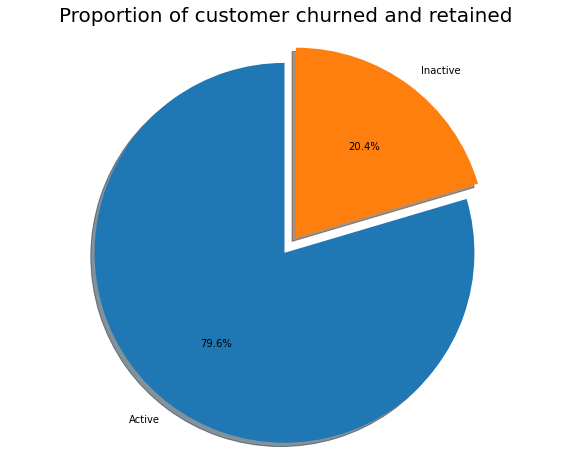

In [39]:
labels = 'Active', 'Inactive'
sizes = [df.Inactive[df['Inactive']==0].count(), df.Inactive[df['Inactive']==1].count()]
explode = (0, 0.1)
fig1, ax1 = plt.subplots(figsize=(10, 8))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Proportion of customer churned and retained", size = 20)
plt.show()

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geography          10000 non-null  object 
 1   Gender             10000 non-null  object 
 2   Age_Band           10000 non-null  object 
 3   TenureYears        10000 non-null  int64  
 4   EstimatedIncome    10000 non-null  float64
 5   BalanceEuros       10000 non-null  float64
 6   NoProducts         10000 non-null  int64  
 7   CreditCardholder   10000 non-null  int64  
 8   CustomerWithLoan   10000 non-null  int64  
 9   Digital_TRX_ratio  10000 non-null  float64
 10  Inactive           10000 non-null  int64  
dtypes: float64(3), int64(5), object(3)
memory usage: 859.5+ KB


- EstimatedIncome, TenureYears, Digital_TRX_ratio have no significant difference between active and inactive customers
- About Balance in euros, inactive customers have some outliers. Mean & std values are the same.

EstimatedIncome
           count          mean           std      min       25%        50%  \
Inactive                                                                     
0         7958.0  87768.219378  49941.365271  1078.36  45181.47  87669.705   
1         2042.0  89287.756053  50388.072935  1010.07  46173.90  90165.720   

                  75%        max  
Inactive                          
0         130291.3400  174993.46  
1         133552.4425  174833.05  


TenureYears
           count      mean       std  min  25%  50%  75%   max
Inactive                                                      
0         7958.0  5.032923  2.880367  0.0  3.0  5.0  7.0  10.0
1         2042.0  4.934378  2.937134  0.0  2.0  5.0  8.0  10.0


BalanceEuros
           count          mean           std        min          25%  \
Inactive                                                               
0         4843.0  78888.540816  19766.060858  9413.4480  65407.34970   
1         1540.0  79707.575409  20

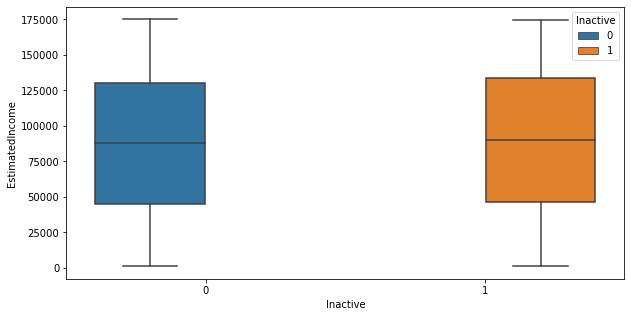

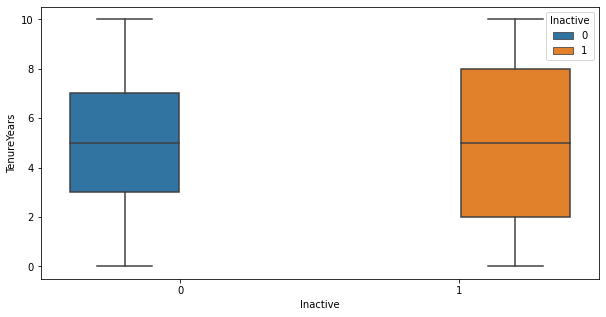

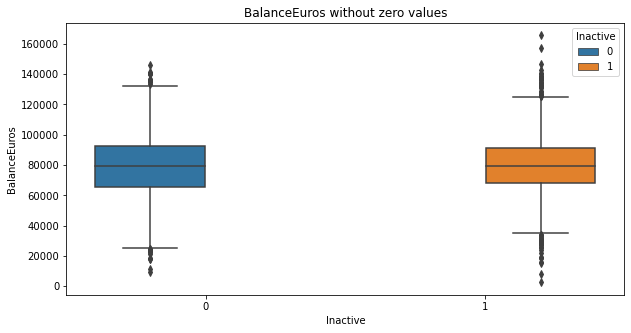

<Figure size 720x360 with 0 Axes>

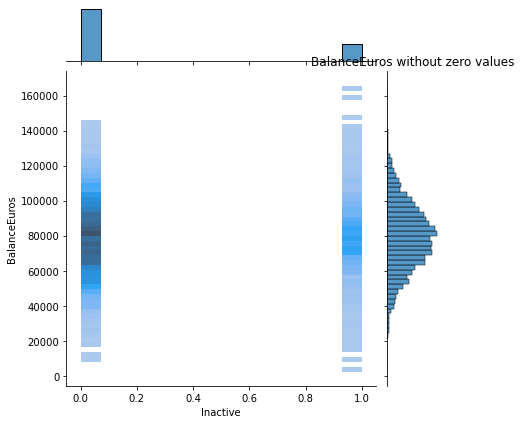

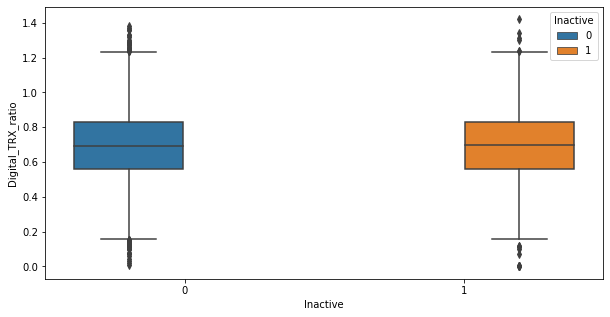

In [41]:
for col in ['EstimatedIncome','TenureYears','BalanceEuros', 'Digital_TRX_ratio']:
    if col == 'BalanceEuros':
        plt.figure(figsize=(10,5))
        sns.boxplot(y=col,x = 'Inactive', hue = 'Inactive',data = df[df[col] != 0],)
        plt.title(col + ' without zero values')
        print(col)
        print(df[df[col] != 0].groupby('Inactive')[col].describe())
        print('\n')

        plt.figure(figsize=(10,5))
        sns.jointplot(y=col, x = 'Inactive', data = df[df[col] != 0], kind='hist')	
        plt.title(col + ' without zero values')
        print(col)
        print(df[df[col] != 0].groupby('Inactive')[col].describe())
        print('\n')
    else:
        plt.figure(figsize=(10,5))
        sns.boxplot(y=col,x = 'Inactive', hue = 'Inactive',data = df)
        print(col)
        print(df.groupby('Inactive')[col].describe())
        print('\n')

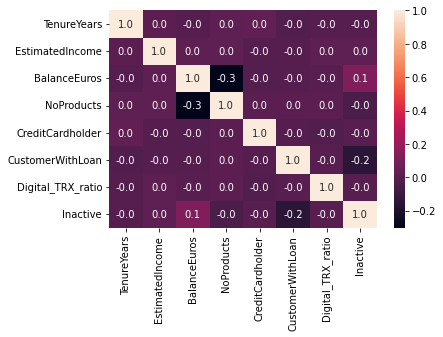

In [42]:
sns.heatmap(df.corr(), annot = True,fmt = ".1f")
plt.show()

## Feature Engineering

In [44]:
def plot_two_sns(dataframe, col):
    plt.figure(figsize=(10,5))
    sns.boxplot(y=col,x = 'Inactive', hue = 'Inactive', data = dataframe)
    plt.title(col)
    print(col)
    print(dataframe.groupby('Inactive')[col].describe())
    print('\n')

    plt.figure(figsize=(10,5))
    sns.jointplot(y=col, x = 'Inactive', data = dataframe, kind='hist')	
    plt.title(col)

In [45]:
# # Balance to Salary ratio
# df['BalanceSalaryRatio'] = df.TenureYears/df.EstimatedIncome
# plot_two_sns(df[df['BalanceEuros'] !=0], 'BalanceSalaryRatio')

In [46]:
# # Balance ratio to Tenure years ratio
# df['Balance_to_Tenure_Ratio'] = df[df.TenureYears != 0]['BalanceEuros'] / df[df.TenureYears != 0].TenureYears
# plot_two_sns(df[df.BalanceEuros !=0], 'Balance_to_Tenure_Ratio')

## Profile of customers

### Balance

In [47]:
df.head()

,Geography,Gender,Age_Band,TenureYears,EstimatedIncome,BalanceEuros,NoProducts,CreditCardholder,CustomerWithLoan,Digital_TRX_ratio,Inactive
0,Rest_GR,Male,18-25,0,40683.96,50086.2120,1,0,0,0.38,0
1,Thessaloniki,Female,65+,4,2429.51,0.0000,1,1,0,0.33,1
2,Athens,Male,45-55,4,41694.49,26852.7072,1,1,1,0.72,0
3,Rest_GR,Male,25-35,5,74523.33,90325.6200,1,0,0,0.08,0
4,Rest_GR,Female,25-35,9,111050.49,100537.0608,2,0,0,1.38,0


In [87]:

alt.data_transformers.disable_max_rows()
alt.Chart(df).mark_circle(size=10).encode(
    x='BalanceEuros',
    y='NoProducts',
    color='Inactive').interactive()#.properties(width=100,height=100)

alt.Chart(...)

- Income is not correlated with Balance in euros
- Inactive Customers without loan are more than inactive customers with a loan
- Inactivity is present at older customers (55-65, 45-55. Most inactive customers are in the age of 35-45)

In [89]:
alt.data_transformers.disable_max_rows()
alt.Chart(df).mark_bar(size=10).encode(
    x='BalanceEuros',
    y='count()',
    column='Inactive').interactive().properties(width=100,height=100)

alt.Chart(...)

In [68]:
import altair as alt
alt.data_transformers.disable_max_rows()
alt.Chart(df).mark_bar(size=10).encode(
    x='Inactive',
    y='count()',
    column='Age_Band').interactive().properties(width=100,height=100)


alt.Chart(...)

- Most inactive customers are not located in Athens and Thessaloniki

In [67]:
alt.data_transformers.disable_max_rows()
alt.Chart(df).mark_bar(size=10).encode(
    x='Inactive',
    y='count()',
    column='Geography').interactive().properties(width=100,height=100)

alt.Chart(...)